In [222]:
import cv2 as cv
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import numpy as np

Text(0.5, 1.0, 'Original Image')

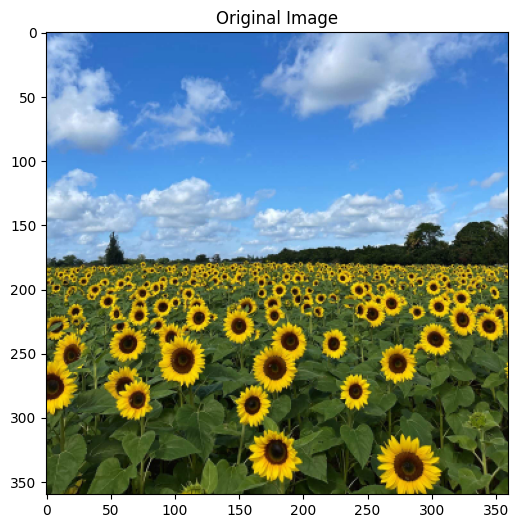

In [223]:
im =cv.imread('images/the_berry_farms_sunflower_field.jpeg', cv.IMREAD_REDUCED_COLOR_4)

fig, ax = plt.subplots(figsize=(10, 6))    

ax.imshow(cv.cvtColor(im, cv.COLOR_BGR2RGB))
ax.set_title('Original Image')

Text(0.5, 1.0, 'LoG Filtered Image (sigma=3.0)')

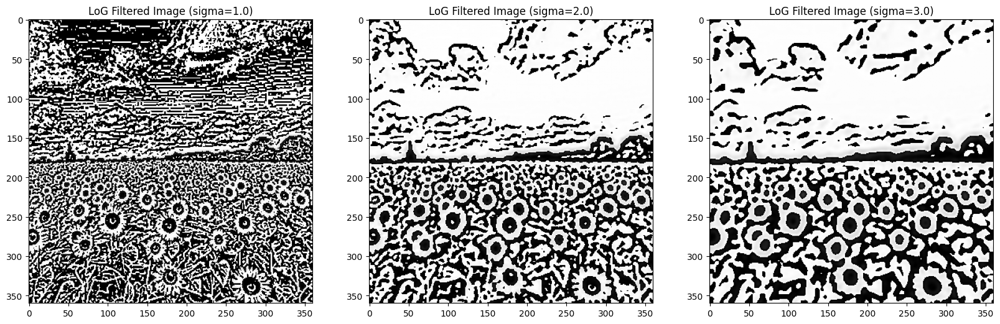

In [224]:
def LoG_filter_opencv(image, sigma, size=None):
    # Generate LoG kernel
    if size is None:
        size = int(6 * sigma + 1) if sigma >= 1 else 7

    if size % 2 == 0:  # Ensure size is odd
        size += 1

    x, y = np.meshgrid(np.arange(-size//2+1, size//2+1),
                       np.arange(-size//2+1, size//2+1))

    kernel = -(1/(np.pi * sigma**4)) * (1 - ((x**2 + y**2) / (2 * sigma**2))) * np.exp(-(x**2 + y**2) / (2 * sigma**2))
    kernel = kernel / np.sum(np.abs(kernel))  # Normalize kernel

    result = cv.filter2D(image.astype(np.float64), cv.CV_64F, kernel)

    return result
#convert to grayscale
gray_im = cv.cvtColor(im, cv.COLOR_RGB2GRAY)

fig, ax = plt.subplots(1,3,figsize=(20, 6))
LoG_image = LoG_filter_opencv(gray_im, sigma=1.0)
LoG_image =LoG_image.astype(np.uint8)
ax[0].imshow(LoG_image, cmap='gray')
ax[0].set_title('LoG Filtered Image (sigma=1.0)')

LoG_image = LoG_filter_opencv(gray_im, sigma=2.0)
LoG_image =LoG_image.astype(np.uint8)
ax[1].imshow(LoG_image, cmap='gray')
ax[1].set_title('LoG Filtered Image (sigma=2.0)')

LoG_image = LoG_filter_opencv(gray_im, sigma=3.0)
LoG_image =LoG_image.astype(np.uint8)
ax[2].imshow(LoG_image, cmap='gray')
ax[2].set_title('LoG Filtered Image (sigma=3.0)')

# Find the largest circle



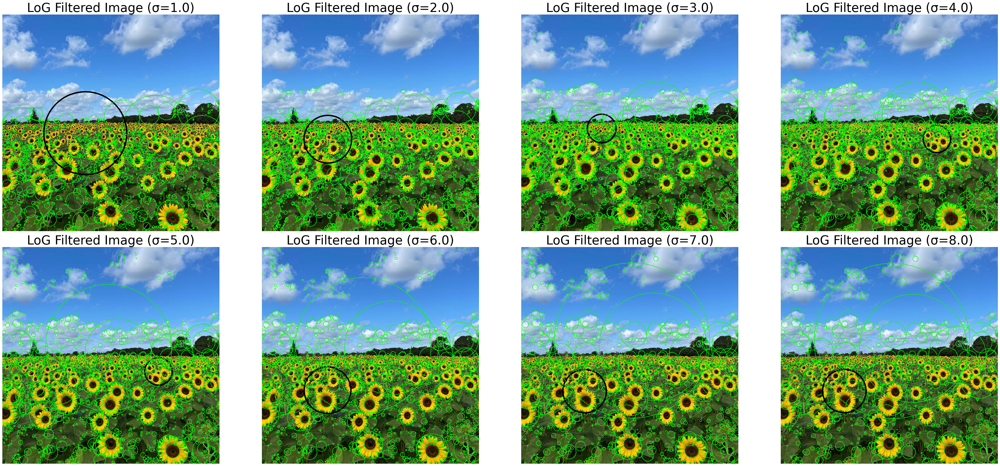


LARGEST CIRCLE DETECTED ACROSS ALL SCALES
Scale (σ):           1.00
Center (x, y):       (550.00, 789.00)
Radius:              275.86 pixels
Area:                33288.50 pixels²
Diameter:            551.72 pixels

Largest circles at each scale:
------------------------------------------------------------
σ=1.0: center=(550.0, 789.0), radius=275.9, area=33288.5
σ=2.0: center=(437.1, 829.6), radius=158.6, area=10835.0
σ=3.0: center=(533.5, 758.5), radius=95.9, area=5636.5
σ=4.0: center=(1035.4, 827.8), radius=91.5, area=11427.0
σ=5.0: center=(1035.6, 827.4), radius=91.5, area=12233.0
σ=6.0: center=(435.0, 952.0), radius=155.0, area=20354.5
σ=7.0: center=(420.7, 958.8), radius=144.9, area=20533.5
σ=8.0: center=(421.1, 957.6), radius=144.1, area=27400.5


In [225]:
import copy
from matplotlib import pyplot as plt
import cv2 as cv
import numpy as np

def drawblobs(gryimage, im):
    # Threshold the image to get binary image
    _, binary = cv.threshold(np.uint8(np.abs(gryimage)), 10, 255, cv.THRESH_BINARY)
    copy_im = copy.deepcopy(im)
    
    # Find contours
    contours, _ = cv.findContours(binary, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    
    # Check if any contours were found
    if len(contours) == 0:
        return copy_im, None
    
    largest = max(contours, key=cv.contourArea)
    largest_area = cv.contourArea(largest)

    for contour in contours:
        if len(contour) >= 5:  # Need at least 5 points to fit ellipse
            (x, y), radius = cv.minEnclosingCircle(contour)
            center = (int(x), int(y))
            radius = int(radius)
            
            # Compare using contour area for consistency
            if cv.contourArea(contour) == largest_area:
                cv.circle(copy_im, center, radius, (0, 0, 0), 8)  # Black for largest
            else:
                cv.circle(copy_im, center, radius, (0, 255, 0), 2)  # Green for others

    return copy_im, largest

im = cv.imread('images/the_berry_farms_sunflower_field.jpeg', cv.IMREAD_COLOR)
gray_im = cv.cvtColor(im, cv.COLOR_BGR2GRAY)

fig, ax = plt.subplots(2, 4, figsize=(45, 20))

# Store information about largest circles at each scale
largest_circles = []

for i, sigma in enumerate(np.arange(1.0, 9.0, 1.0)):

    LoG_image = LoG_filter_opencv(gray_im, sigma=sigma)
    im_copy = im.copy()
    blobImage, largest = drawblobs(LoG_image, im_copy)

    # Store largest circle info if found
    if largest is not None:
        (x, y), radius = cv.minEnclosingCircle(largest)
        area = cv.contourArea(largest)
        largest_circles.append({
            'sigma': sigma,
            'center_x': x,
            'center_y': y,
            'radius': radius,
            'area': area
        })

    ax[i // 4, i % 4].imshow(cv.cvtColor(blobImage, cv.COLOR_BGR2RGB))  
    ax[i // 4, i % 4].set_title(f'LoG Filtered Image (σ={sigma:.1f})', fontsize=38)
    ax[i // 4, i % 4].axis('off')

plt.tight_layout()
plt.show()

if largest_circles:
    overall_largest = max(largest_circles, key=lambda x: x['area'])
    
    print("\n" + "="*60)
    print("LARGEST CIRCLE DETECTED ACROSS ALL SCALES")
    print("="*60)
    print(f"Scale (σ):           {overall_largest['sigma']:.2f}")
    print(f"Center (x, y):       ({overall_largest['center_x']:.2f}, {overall_largest['center_y']:.2f})")
    print(f"Radius:              {overall_largest['radius']:.2f} pixels")
    print(f"Area:                {overall_largest['area']:.2f} pixels²")
    print(f"Diameter:            {2 * overall_largest['radius']:.2f} pixels")
    print("="*60)
    
    print("\n" + "Largest circles at each scale:")
    print("-"*60)
    for info in largest_circles:
        print(f"σ={info['sigma']:.1f}: center=({info['center_x']:.1f}, {info['center_y']:.1f}), "
              f"radius={info['radius']:.1f}, area={info['area']:.1f}")
else:
    print("No circles detected!")


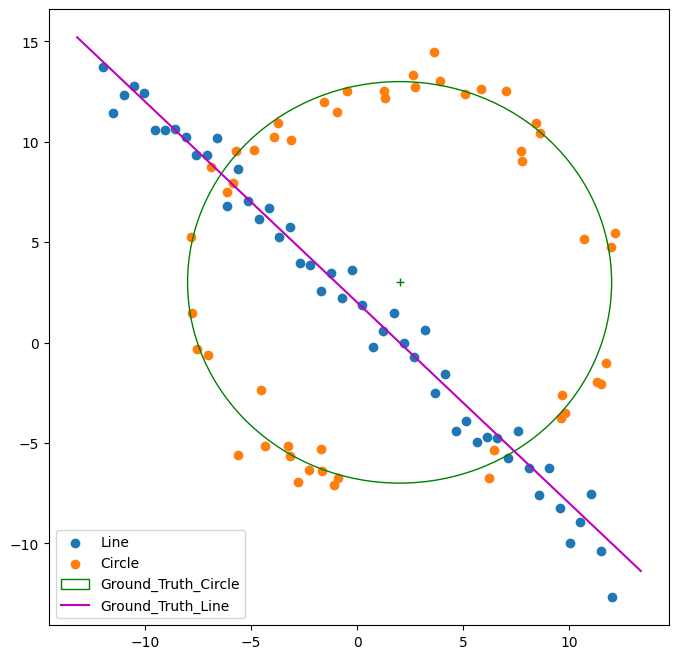

In [226]:
import numpy as np
from scipy.optimize import minimize
from scipy import linalg
import matplotlib.pyplot as plt
#import tikzplotlib

#np.random.seed(0)
N = 100
half_n = N//2
r = 10
# Generating values for circle
x0_gt, y0_gt = 2, 3  # Center
s = r/16
t = np.random.uniform(0, 2*np.pi, half_n)
n = s*np.random.randn(half_n)
x, y = x0_gt + (r + n)*np.cos(t), y0_gt + (r + n)*np.sin(t)
X_circ = np.hstack((x.reshape(half_n, 1), y.reshape(half_n, 1)))

s = 1.
m, b = -1, 2
x = np.linspace(-12, 12, half_n)
y = m*x + b + s*np.random.randn(half_n)
X_line = np.hstack((x.reshape(half_n, 1), y.reshape(half_n, 1)))

X = np.vstack((X_circ, X_line))  # All points

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.scatter(X_line[:, 0], X_line[:, 1], label='Line')
ax.scatter(X_circ[:, 0], X_circ[:, 1], label='Circle')
circle_gt = plt.Circle((x0_gt, y0_gt), r, color='g', fill=False, label='Ground_Truth_Circle')
ax.add_patch(circle_gt)
ax.plot(x0_gt, y0_gt, '+', color='g')
x_min, x_max = ax.get_xlim()
x_ = np.array([x_min, x_max])
y_ = m*x_ + b
plt.plot(x_, y_, color='m', label='Ground_Truth_Line')
plt.legend()
plt.show()


Max Inliers: 47
Estimated Line: y = -1.11x + 1.42


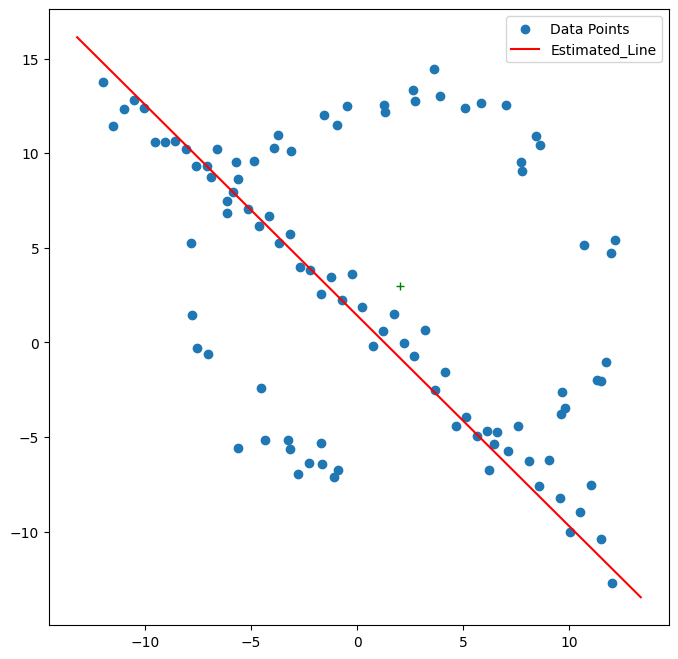

In [227]:
# RANSAC for line fitting 
distance_threshold = 1
num_itterations = 1000

inlier = []
lineparam = []
num_inliers = []

for i in range(num_itterations):

    idx = np.random.choice(X.shape[0], 2, replace=False)

    # compute line parameters
    x1, y1 = X[idx[0]]
    x2, y2 = X[idx[1]]

    if x2 == x1:  
        continue

    m = (y2 - y1) / (x2 - x1)
    b = y1 - m * x1

    inlier = []

    for x, y in X:
        # calculate perpendicular distance to the line
        distance = np.abs(m * x - y + b) / np.sqrt(m**2 + 1)
        if distance < distance_threshold:
            inlier.append((x, y))  

    
    num_inliers.append(len(inlier))
    lineparam.append((m, b))

# find best line with most inliers
best_idx = int(np.argmax(num_inliers))
m, b = lineparam[best_idx]

print(f"Max Inliers: {max(num_inliers)}")
print(f"Estimated Line: y = {m:.2f}x + {b:.2f}")

# visualize
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.scatter(X[:, 0], X[:, 1], label='Data Points')
ax.plot(x0_gt, y0_gt, '+', color='g')
x_min, x_max = ax.get_xlim()
x_ = np.array([x_min, x_max])
y_ = m * x_ + b
plt.plot(x_, y_, color='r', label='Estimated_Line')
plt.legend()
plt.show()
